In [2]:
#Utility functions which will be used to build a transform matrix
#from the rotation and translation data given from the T265 camera

from math import cos, sin, radians

def trig(angle):
    r = radians(angle)
    return cos(r), sin(r)

def matrix(rotation, translation):
    xC, xS = trig(rotation[0])
    yC, yS = trig(rotation[1])
    zC, zS = trig(rotation[2])
    dX = translation[0]
    dY = translation[1]
    dZ = translation[2]
    Translate_matrix = np.array([[1, 0, 0, dX],
                               [0, 1, 0, dY],
                               [0, 0, 1, dZ],
                               [0, 0, 0, 1]])
    Rotate_X_matrix = np.array([[1, 0, 0, 0],
                              [0, xC, -xS, 0],
                              [0, xS, xC, 0],
                              [0, 0, 0, 1]])
    Rotate_Y_matrix = np.array([[yC, 0, yS, 0],
                              [0, 1, 0, 0],
                              [-yS, 0, yC, 0],
                              [0, 0, 0, 1]])
    Rotate_Z_matrix = np.array([[zC, -zS, 0, 0],
                              [zS, zC, 0, 0],
                              [0, 0, 1, 0],
                              [0, 0, 0, 1]])
    return np.dot(Rotate_Z_matrix,np.dot(Rotate_Y_matrix,np.dot(Rotate_X_matrix,Translate_matrix)))

In [3]:
#Initializing Gradslam ICL Dataset

# import necessary packages
import gradslam as gs
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
from gradslam import Pointclouds, RGBDImages
from gradslam.datasets import ICL
from gradslam.slam import PointFusion
from torch.utils.data import DataLoader
from torch.utils.cpp_extension import CUDA_HOME

# download 'lr kt1' of ICL dataset
if not os.path.isdir('ICL'):
    os.mkdir('ICL')
if not os.path.isdir('ICL/living_room_traj1_frei_png'):
    print('Downloading ICL/living_room_traj1_frei_png dataset...')
    os.mkdir('ICL/living_room_traj1_frei_png')
    !wget http://www.doc.ic.ac.uk/~ahanda/living_room_traj1_frei_png.tar.gz -P ICL/living_room_traj1_frei_png/ -q
    !tar -xzf ICL/living_room_traj1_frei_png/living_room_traj1_frei_png.tar.gz -C ICL/living_room_traj1_frei_png/
    !rm ICL/living_room_traj1_frei_png/living_room_traj1_frei_png.tar.gz
    !wget https://www.doc.ic.ac.uk/~ahanda/VaFRIC/livingRoom1n.gt.sim -P ICL/living_room_traj1_frei_png/ -q
    print('Downloaded.')
icl_path = 'ICL/'

In [6]:
#Modifying ICL Dataset to include newly captured trajectory
#using the realsense D435i and T265 cameras
#If you wish to run gradslam without using the cameras and using the default ICL dataset, skip this cell.

###############################################
##      Open CV and Numpy integration        ##
###############################################

import pyrealsense2 as rs
import cv2
import glob

# Configure depth and color streams
pipeline1 = rs.pipeline()
config1 = rs.config()
#Initializing D435i camera. The serial number can be found by running rs-enumerate-devices in a terminal with the camera connected
config1.enable_device('943222072624')
config1.enable_stream(rs.stream.depth, 640, 480, rs.format.z16, 30)
config1.enable_stream(rs.stream.color, 640, 480, rs.format.bgr8, 30)

pipeline2 = rs.pipeline()
config2 = rs.config()
#Initializing T265 camera. The serial number can be found by running rs-enumerate-devices in a terminal with the camera connected
config2.enable_device('929122110150')
config2.enable_stream(rs.stream.pose)

# Start streaming from both of the cameras
pipeline1.start(config1)
pipeline2.start(config2)

#initializing index to be used for associating color and depth images.
association_index = 0

#Deleting previous depth and rgb data so that they are replaced with new ones.
old_depth = glob.glob('ICL/living_room_traj1_frei_png/depth/*')
for f in old_depth:
    os.remove(f)
old_rgb = glob.glob('ICL/living_room_traj1_frei_png/rgb/*')
for f in old_rgb:
    os.remove(f)

#Clearing pose file to save fresh poses.
f = open("ICL/living_room_traj1_frei_png/livingRoom1n.gt.sim","w")
f.close()

#Clearing associations file to save fresh associations.
f = open("ICL/living_room_traj1_frei_png/associations.txt","w")
f.close()

#Boolean to be used to reject some initial captured frames as they always appears to be dark
#Because the camera takes some time to calibrate to external lighting conditions

initial_frames = 8

try:
    while True:

        # Wait for a coherent pair of frames: depth, color and pose
        frames1 = pipeline1.wait_for_frames()
        depth_frame = frames1.get_depth_frame()
        color_frame = frames1.get_color_frame()
        
        frames2 = pipeline2.wait_for_frames()
        pose_frame = frames2.get_pose_frame()
        
        #Wait for consistent frame
        if not depth_frame or not color_frame or not pose_frame:
            continue
        
        #If it is an early frame, discard it
        if initial_frames > 0:
            initial_frames -= 1
            continue

        # Convert images to numpy arrays
        depth_image = np.asanyarray(depth_frame.get_data())
        color_image = np.asanyarray(color_frame.get_data())
        
        # Scaling depth images to add variance
        depth_image *= 10
        depth_image += 1000
        
        #Fetch pose data
        pose_data = pose_frame.get_pose_data()
        #save depth and color images in corresponding folder to create rgbd dataset.
        cv2.imwrite('ICL/living_room_traj1_frei_png/depth/' + str(association_index) + '.png', depth_image)
        cv2.imwrite('ICL/living_room_traj1_frei_png/rgb/' + str(association_index) + '.png', color_image)
        print("image written")
        
        #obtain and format pose data to aggregate dataset with pose
        
        #parse translation data
        pose_data_translation = '{}'.format(pose_data.translation)
        pose_data_translation = pose_data_translation.replace(',', '')
        pose_data_translation = pose_data_translation.split()
        indices = [1,3,5]
        pose_data_translation =  [pose_data_translation[index] for index in indices]
        pose_data_translation_string = ' '.join(pose_data_translation)
        #parse velocity data
        pose_data_velocity = '{}'.format(pose_data.velocity)
        pose_data_velocity = pose_data_velocity.replace(',', '')
        pose_data_velocity = pose_data_velocity.split()
        indices = [1,3,5]
        pose_data_velocity =  [pose_data_velocity[index] for index in indices]
        pose_data_velocity_string = ' '.join(pose_data_velocity)
        #parse acceleration data
        pose_data_acceleration = '{}'.format(pose_data.acceleration)
        pose_data_acceleration = pose_data_acceleration.replace(',', '')
        pose_data_acceleration = pose_data_acceleration.split()
        indices = [1,3,5]
        pose_data_acceleration =  [pose_data_acceleration[index] for index in indices]
        pose_data_acceleration_string = ' '.join(pose_data_acceleration)
        #parse rotation data
        pose_data_rotation = '{}'.format(pose_data.rotation)
        pose_data_rotation = pose_data_rotation.replace(',', '')
        pose_data_rotation = pose_data_rotation.split()
        indices = [1,3,5]            #exclude labels x,y,z and get only values
        pose_data_rotation =  [pose_data_rotation[index] for index in indices]
        pose_data_rotation_string = ' '.join(pose_data_rotation)
        
        #creating the transform matrix
        pose_data_rotation_floats = [float(rot) for rot in pose_data_rotation]
        pose_data_translation_floats = [float(tran) for tran in pose_data_translation]
        transform_matrix = matrix(pose_data_rotation_floats, pose_data_translation_floats)
        print(transform_matrix)
        
        #writing the first three rows of the transform matrix into the appropriate file
        f = open("ICL/living_room_traj1_frei_png/livingRoom1n.gt.sim", "a")
        f.writelines(' '.join("{:.6f}".format(j) for j in i) + '\n' for i in transform_matrix[0:3])
        f.write('\n')
        print("pose written")
        f.close
        
        #saving correct depth-color associations to associations.txt
        f = open("ICL/living_room_traj1_frei_png/associations.txt", "a")
        #creating a variable to save the association_index for abbreviation purposes
        a_in = str(association_index)
        f.write(a_in + ' ' + "depth/" + a_in + ".png" + ' ' + a_in + ' ' + "rgb/" + a_in + ".png")
        f.write('\n')
        f.close
        

        #increment association_index to save the next pair of depth-rgb images
        association_index+=1

        # Apply colormap on depth image (image must be converted to 8-bit per pixel first)
        depth_colormap = cv2.applyColorMap(cv2.convertScaleAbs(depth_image, alpha=0.03), cv2.COLORMAP_JET)

        depth_colormap_dim = depth_colormap.shape
        color_colormap_dim = color_image.shape

        # If depth and color resolutions are different, resize color image to match depth image for display
        if depth_colormap_dim != color_colormap_dim:
            resized_color_image = cv2.resize(color_image, dsize=(depth_colormap_dim[1], depth_colormap_dim[0]), interpolation=cv2.INTER_AREA)
            images = np.hstack((resized_color_image, depth_colormap))
        else:
            images = np.hstack((color_image, depth_colormap))

        # Show images
        cv2.namedWindow('RealSense', cv2.WINDOW_AUTOSIZE)
        cv2.imshow('RealSense', images)
        key = cv2.waitKey(1)
        if key == 27:
            break

finally:

    # Stop streaming
    pipeline1.stop()
    pipeline2.stop()
    print("Finished")

image written
[[ 9.99999944e-01 -3.19516115e-04  9.57901760e-05  3.28259310e-04]
 [ 3.19519165e-04  9.99999948e-01 -3.18200829e-05 -1.29887637e-03]
 [-9.57800040e-05  3.18506879e-05  9.99999995e-01 -1.21867278e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written


QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to target thread (0x5646616edf90)

QObject::moveToThread: Current thread (0x5646616edf90) is not the object's thread (0x564661859f00).
Cannot move to tar

image written
[[ 9.99999943e-01 -3.27238485e-04  8.72328419e-05 -4.70388658e-05]
 [ 3.27243992e-04  9.99999944e-01 -6.31171202e-05 -9.34529117e-04]
 [-8.72121827e-05  6.31456630e-05  9.99999994e-01 -9.87042887e-04]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999943e-01 -3.26948868e-04  8.80265384e-05  2.31972637e-04]
 [ 3.26954267e-04  9.99999945e-01 -6.13289706e-05 -5.17478309e-04]
 [-8.80064821e-05  6.13577477e-05  9.99999994e-01 -1.30181216e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999942e-01 -3.26897353e-04  9.08216851e-05  3.71262819e-04]
 [ 3.26903652e-04  9.99999944e-01 -6.93525620e-05 -7.52612670e-04]
 [-9.07990089e-05  6.93822479e-05  9.99999993e-01 -1.03783592e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999942e-01 -3.29761392e-04  9.00323164e-05  9.57881913e-05]
 [ 3.29767738e-04  9.99999943e-

pose written
image written
[[ 9.99999945e-01 -3.11697487e-04  1.08924176e-04 -4.19531717e-04]
 [ 3.11682636e-04  9.99999942e-01  1.36332302e-04 -1.21182773e-03]
 [-1.08966665e-04 -1.36298345e-04  9.99999985e-01 -1.59130912e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999956e-01 -2.70857538e-04  1.21098609e-04 -2.18582966e-04]
 [ 2.70831461e-04  9.99999940e-01  2.15296478e-04 -6.99216582e-04]
 [-1.21156917e-04 -2.15263671e-04  9.99999969e-01 -1.93407305e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999964e-01 -2.35067144e-04  1.29720352e-04 -4.93057613e-04]
 [ 2.35034760e-04  9.99999941e-01  2.49603849e-04 -2.56933111e-04]
 [-1.29779018e-04 -2.49573352e-04  9.99999960e-01 -2.48101201e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999967e-01 -2.06696399e-04  1.54354883e-04 -8.04298248e-04]
 [ 2.06648725e-04 

image written
[[ 9.99999643e-01  6.78784760e-04  5.02983043e-04 -2.31908220e-02]
 [-6.80236702e-04  9.99995586e-01  2.89213630e-03  4.46770839e-02]
 [-5.01017685e-04 -2.89247741e-03  9.99995691e-01 -2.40447799e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999616e-01  7.10317193e-04  5.13753944e-04 -2.40696948e-02]
 [-7.11811438e-04  9.99995500e-01  2.91417369e-03  4.90130629e-02]
 [-5.11681645e-04 -2.91453826e-03  9.99995622e-01 -2.48915758e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999606e-01  7.20473400e-04  5.18302681e-04 -2.52004978e-02]
 [-7.22011137e-04  9.99995320e-01  2.97282546e-03  5.22556144e-02]
 [-5.16158414e-04 -2.97319851e-03  9.99995447e-01 -2.55158695e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999586e-01  7.38346929e-04  5.32420909e-04 -2.63916463e-02]
 [-7.39937401e-04  9.99995246e-

image written
[[ 9.99999037e-01  8.83435801e-04  1.07049934e-03 -8.90306563e-02]
 [-8.86249647e-04  9.99996146e-01  2.63091851e-03  9.73538860e-02]
 [-1.06817097e-03 -2.63186471e-03  9.99995966e-01  6.00555194e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999062e-01  8.72780687e-04  1.05557113e-03 -9.06023104e-02]
 [-8.75561275e-04  9.99996141e-01  2.63661530e-03  9.91684896e-02]
 [-1.05326587e-03 -2.63753704e-03  9.99995967e-01  6.05227121e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999049e-01  8.86575674e-04  1.05608262e-03 -9.06951251e-02]
 [-8.89324928e-04  9.99996210e-01  2.60563830e-03  9.98747418e-02]
 [-1.05376852e-03 -2.60657503e-03  9.99996048e-01  6.08672847e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999097e-01  8.85611637e-04  1.01105540e-03 -9.11563089e-02]
 [-8.88255083e-04  9.99996181e-

image written
[[ 9.99999734e-01  6.93423099e-04 -2.24847736e-04 -1.00039338e-01]
 [-6.92941018e-04  9.99997476e-01  2.13706602e-03  1.11031184e-01]
 [ 2.26329059e-04 -2.13690964e-03  9.99997691e-01  6.29575708e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999740e-01  6.76180007e-04 -2.50797650e-04 -9.91461647e-02]
 [-6.75625607e-04  9.99997343e-01  2.20408268e-03  1.10703649e-01]
 [ 2.52287341e-04 -2.20391266e-03  9.99997540e-01  6.27584888e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999750e-01  6.45793925e-04 -2.89271682e-04 -9.95160743e-02]
 [-6.45127725e-04  9.99997153e-01  2.29723036e-03  1.09455857e-01]
 [ 2.90754396e-04 -2.29704316e-03  9.99997320e-01  6.28103359e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999740e-01  6.41303369e-04 -3.29290763e-04 -9.89794778e-02]
 [-6.40540993e-04  9.99997127e-

image written
[[ 9.99997054e-01  5.03867937e-04 -2.37428186e-03 -7.80666387e-02]
 [-4.96363237e-04  9.99994883e-01  3.16035922e-03  9.83405191e-02]
 [ 2.37586212e-03 -3.15917140e-03  9.99992187e-01  2.86722804e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99996789e-01  4.97975028e-04 -2.48466910e-03 -7.78107072e-02]
 [-4.90001399e-04  9.99994732e-01  3.20870867e-03  9.80472589e-02]
 [ 2.48625386e-03 -3.20748087e-03  9.99991765e-01  2.70288836e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99996546e-01  5.07242695e-04 -2.57897436e-03 -7.59776602e-02]
 [-4.98965262e-04  9.99994726e-01  3.20921434e-03  9.71228847e-02]
 [ 2.58058861e-03 -3.20791643e-03  9.99991525e-01  2.61020886e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99996439e-01  4.84272077e-04 -2.62438864e-03 -7.52952108e-02]
 [-4.75638961e-04  9.99994477e-

image written
[[ 9.99992380e-01  1.28591228e-04 -3.90167903e-03 -6.03685878e-02]
 [-1.16538935e-04  9.99995222e-01  3.08907172e-03  9.65055196e-02]
 [ 3.90205761e-03 -3.08859349e-03  9.99987617e-01  1.70613599e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99992382e-01  1.40009003e-04 -3.90072074e-03 -6.05032859e-02]
 [-1.28020671e-04  9.99995269e-01  3.07344342e-03  9.65681064e-02]
 [ 3.90113260e-03 -3.07292063e-03  9.99987669e-01  1.69150055e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99992429e-01  1.44683443e-04 -3.88852530e-03 -6.08235660e-02]
 [-1.32770206e-04  9.99995298e-01  3.06377380e-03  9.67379840e-02]
 [ 3.88895029e-03 -3.06323432e-03  9.99987746e-01  1.64953049e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99992476e-01  1.49746002e-04 -3.87617167e-03 -6.10146016e-02]
 [-1.37907899e-04  9.99995327e-

image written
[[ 9.99997358e-01  4.61609234e-04 -2.25169783e-03 -7.55304209e-02]
 [-4.56203458e-04  9.99997014e-01  2.40067837e-03  1.00103437e-01]
 [ 2.25279928e-03 -2.39964480e-03  9.99994583e-01  3.05348776e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99997563e-01  4.60504915e-04 -2.15917947e-03 -7.58849363e-02]
 [-4.55398957e-04  9.99997100e-01  2.36466329e-03  9.98407605e-02]
 [ 2.16026215e-03 -2.36367424e-03  9.99994873e-01  3.05142175e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99997809e-01  4.75328894e-04 -2.03873290e-03 -7.66066517e-02]
 [-4.70578167e-04  9.99997175e-01  2.33008197e-03  9.97241864e-02]
 [ 2.03983470e-03 -2.32911748e-03  9.99995207e-01  3.06946011e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99998050e-01  4.87950045e-04 -1.91350694e-03 -7.73767038e-02]
 [-4.83544309e-04  9.99997233e-

image written
[[ 9.99999389e-01  5.66298684e-04 -9.49115413e-04 -8.10313775e-02]
 [-5.64149471e-04  9.99997280e-01  2.26317872e-03  9.73276912e-02]
 [ 9.50394466e-04 -2.26264189e-03  9.99996989e-01  3.74953348e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999399e-01  5.73019175e-04 -9.34246338e-04 -8.11453911e-02]
 [-5.70916116e-04  9.99997306e-01  2.24979001e-03  9.74980226e-02]
 [ 9.35532995e-04 -2.24925529e-03  9.99997033e-01  3.74177512e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999403e-01  5.72522220e-04 -9.30260863e-04 -8.10345194e-02]
 [-5.70413464e-04  9.99997271e-01  2.26553010e-03  9.74749624e-02]
 [ 9.31555391e-04 -2.26499812e-03  9.99997001e-01  3.72195959e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999419e-01  5.61243286e-04 -9.20664589e-04 -8.12436952e-02]
 [-5.59150866e-04  9.99997264e-

pose written
image written
[[ 9.99999506e-01  5.98788843e-04 -7.93340216e-04 -8.32358860e-02]
 [-5.96977429e-04  9.99997219e-01  2.28154755e-03  9.82506284e-02]
 [ 7.94704175e-04 -2.28107282e-03  9.99997083e-01  3.86285148e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999507e-01  6.01316727e-04 -7.89726304e-04 -8.31795845e-02]
 [-5.99515139e-04  9.99997222e-01  2.27954028e-03  9.80928537e-02]
 [ 7.91094836e-04 -2.27906570e-03  9.99997090e-01  3.81138152e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999506e-01  5.98855007e-04 -7.93448146e-04 -8.32264482e-02]
 [-5.97045497e-04  9.99997225e-01  2.27884242e-03  9.82008037e-02]
 [ 7.94810640e-04 -2.27836757e-03  9.99997089e-01  3.79177904e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
pose written
image written
[[ 9.99999511e-01  6.00735524e-04 -7.85170637e-04 -8.29062275e-02]
 [-5.98944418e-04 

KeyboardInterrupt: 


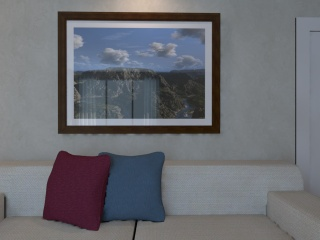
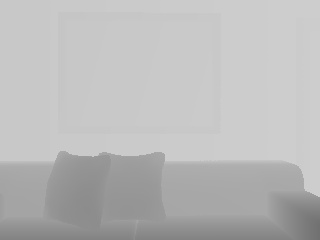
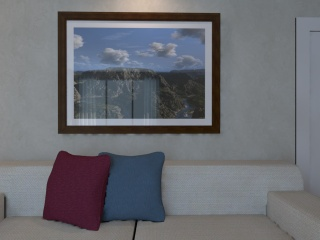
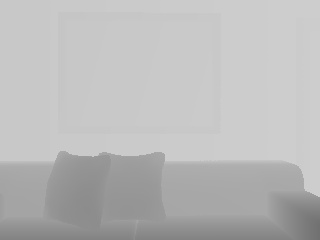
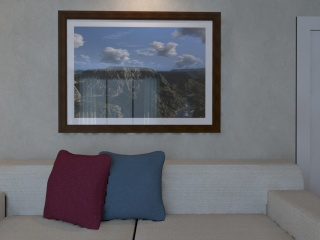
...
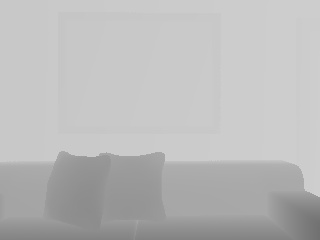
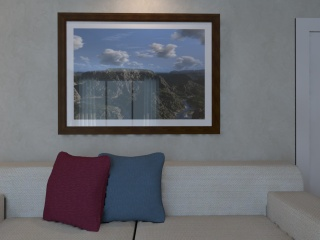
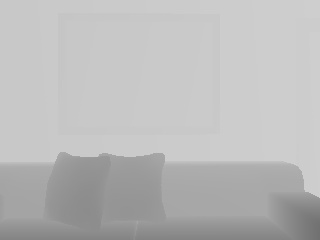
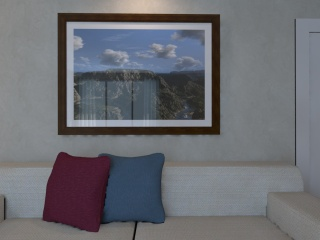
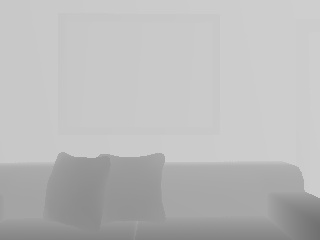

In [4]:
# load dataset
dataset = ICL(icl_path, seqlen=8, height=240, width=320)
loader = DataLoader(dataset=dataset, batch_size=2)
colors, depths, intrinsics, poses, *_ = next(iter(loader))
# create rgbdimages object
rgbdimages = RGBDImages(colors, depths, intrinsics, poses)
rgbdimages.plotly(0).update_layout(autosize=False, height=600, width=400).show()

torch.Size([2, 8, 240, 320, 3])
torch.Size([2, 8, 240, 320, 3])
torch.Size([2, 8, 240, 320, 3])
torch.Size([2, 8, 240, 320, 3])
---


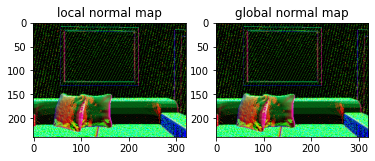

In [5]:
# compute vertex maps and normal maps
print(rgbdimages.vertex_map.shape)  # torch.Size([2, 8, 240, 320, 3])
print(rgbdimages.normal_map.shape)  # torch.Size([2, 8, 240, 320, 3])
print(rgbdimages.global_vertex_map.shape)  # torch.Size([2, 8, 240, 320, 3])
print(rgbdimages.global_normal_map.shape)  # torch.Size([2, 8, 240, 320, 3])
print('---')

# visualize
fig, ax = plt.subplots(1, 2)
ax[0].title.set_text('local normal map')
ax[0].imshow((rgbdimages.normal_map[-1, -1].numpy() * 255).astype(np.uint8))
ax[1].title.set_text('global normal map')
ax[1].imshow((rgbdimages.global_normal_map[-1, -1].numpy() * 255).astype(np.uint8))
plt.show()

In [6]:
#Regular Pointfusion
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
slam = PointFusion(device=device)
pointclouds, recovered_poses = slam(rgbdimages)
pointclouds.plotly(0, max_num_points=15000).update_layout(autosize=False, width=600).show()

In [7]:
# step by step Pointfusion (SLAM)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
slam = PointFusion(device=device)

pointclouds = Pointclouds(device=device)
batch_size, seq_len = rgbdimages.shape[:2]
initial_poses = torch.eye(4, device=device).view(1, 1, 4, 4).repeat(batch_size, 1, 1, 1)
prev_frame = None
for s in range(seq_len):
    live_frame = rgbdimages[:, s].to(device)
    if s == 0 and live_frame.poses is None:
        live_frame.poses = initial_poses
    pointclouds, live_frame.poses = slam.step(pointclouds, live_frame, prev_frame)
    prev_frame = live_frame
pointclouds.plotly(0, max_num_points=15000).update_layout(autosize=False, width=600).show()


In [9]:
cv2.__version__

NameError: name 'cv2' is not defined